In [10]:
"""
Data visualization
Author: Xionghui Xu
Date: July 11, 2025
"""
import os
import numpy as np
import xarray as xr
import pandas as pd
import netCDF4 as nc
import geopandas as gpd
import rioxarray as rxr
from concurrent.futures import ThreadPoolExecutor
import warnings
from pathlib import Path

In [11]:
#### Here we set the configuration
resolution = "500"
region = [-124.8,-66.95,24.5,49.4]
data_path = f'data/run/'
shp_path = 'data/Shp/'
field_path = 'data/field/'
fig_path = 'fig/'

# Visualization

## 1. Data Export

In [12]:
def load_and_flatten_data(file_name, variable_name, index=None, path='data/run/'):
    try:
        with nc.Dataset(f"{path}{file_name}.nc4") as dataset:
            data = dataset[variable_name][index, :, :].flatten() if index is not None else dataset[variable_name][:, :].flatten()
        return data
    except Exception as e:
        warnings.warn(f"Error loading {file_name}.nc4 or variable {variable_name}: {e}")
        return None

def load_lat_lon(data_path):
    try:
        with nc.Dataset(f"{data_path}masking_criteria/mask_combine_all.nc4") as dataset:
            lat = dataset['lat'][:]
            lon = dataset['lon'][:]
            # Use meshgrid for efficient grid creation
            lon_grid, lat_grid = np.meshgrid(lon, lat)
            return lat_grid.ravel(), lon_grid.ravel()
    except Exception as e:
        warnings.warn(f"Error loading lat/lon from masking_criteria/mask_combine_all.nc4: {e}")
        return None, None

def load_all_data(file_variable_list, data_path='data/run/'):
    # Initialize DataFrame
    df = pd.DataFrame()

    # Load lat/lon first
    lat, lon = load_lat_lon(data_path)
    if lat is None or lon is None:
        raise RuntimeError("Failed to load latitude/longitude data")
    df['lat'] = lat
    df['lon'] = lon

    # Load other variables
    for file_name, variable_name, index in file_variable_list:
        data = load_and_flatten_data(file_name, variable_name, index, data_path)
        if data is not None:
            df[file_name] = data

    return df

def assign_geo_attributes(df, country_file='World_CN/ne_10m_admin_0_countries_chn.shp'):
    """
    Assign country attributes to DataFrame points based on shapefiles.
    """
    shp = gpd.read_file(shp_path+country_file)
    df = df.reset_index(drop=True)
    gdf_points = gpd.GeoDataFrame(geometry=gpd.points_from_xy(df['lon'], df['lat'], crs='EPSG:4326'))
    
    result = gpd.sjoin(gdf_points, shp, how='left', predicate='within')

    df['ISO_A3'] = result['ISO_A3']
    df = df[df['ISO_A3'] == 'USA']
    return df

file_variable_list = [
    ('masking_criteria/mask_combine_all', 'Band1', None),
    ('Sbedrock', 'Band1', None),
    ('Sr', 'Band1', None),
]


df = load_all_data(file_variable_list, data_path)
df = df[df['masking_criteria/mask_combine_all'] == 1]
df = df.drop(columns=['masking_criteria/mask_combine_all'])
df = assign_geo_attributes(df)

df

,lat,lon,Sbedrock,Sr,ISO_A3
57199572,18.997922,-155.614582,233.028687,299.253510,USA
57199573,18.997922,-155.610415,217.994583,279.946869,USA
57204016,19.002089,-155.614582,219.239380,285.790680,USA
57204017,19.002089,-155.610415,205.094910,267.352600,USA
57204018,19.002089,-155.606249,190.950455,248.914520,USA
...,...,...,...,...,...
156196376,70.327092,-158.602082,23.288706,70.058655,USA
156196377,70.327092,-158.597916,25.313814,69.968712,USA
156199119,70.331258,-158.606249,22.412987,69.513939,USA
156220711,70.364592,-156.164582,9.513536,91.575523,USA


## 2. Plotting

In [13]:
%matplotlib inline

import geopandas as gpd
from pylab import rcParams
import seaborn as sns
import matplotlib
import matplotlib.pyplot as plt
import matplotlib.colors as colors
import matplotlib.ticker as ticker
import matplotlib.patches as patches
import matplotlib.font_manager as fm
from matplotlib.gridspec import GridSpec
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from cartopy.mpl.ticker import LongitudeFormatter, LatitudeFormatter
from shapely.geometry import box
from shapely.ops import unary_union
import cmaps

In [14]:
os.makedirs(f'{fig_path}', exist_ok=True)

pd.set_option('display.max_columns', None)

params = {'font.family': 'Arial',
          'backend': 'ps',
          'axes.labelsize': 25,
          'grid.linewidth': 0.2,
          'font.size': 25,
          'legend.fontsize': 18,
          'legend.frameon': False,
          'xtick.labelsize': 30,
          'xtick.direction': 'out',
          'ytick.labelsize': 30,
          'ytick.direction': 'out',
          'legend.handlelength': 1,
          'legend.handleheight': 1,
          'savefig.bbox': 'tight',
          'axes.unicode_minus': False,
          "mathtext.default":"regular",
          'text.usetex': False}
rcParams.update(params)

font_properties = fm.FontProperties(family='Arial', weight='bold')
shp = gpd.GeoDataFrame.from_file(shp_path+'US/USA_adm0.shp')
size = 0.0005

### 2.1 Extended Data Figs. 7a, 7c

In [15]:
df1 = df.copy()

In [22]:
def draw1(df1,name,level,cmap):
    df1 = df1[df1[name[0]] > 0]

    fig = plt.figure(figsize=(12, 6), dpi=500)

    fig.subplots_adjust(left=0.05, right=0.98, 
                    bottom=0.14, top=0.95, hspace=0.25) 
        
    #Create a subgraph grid with 2 rows and 3 columns
    gs = GridSpec(2, 6)
    ax = fig.add_subplot(gs[:, :], projection=ccrs.PlateCarree())

    # Set drawing mode(note:extent's lat from positive to negative)
    img = ax.scatter(df1['lon'], df1['lat'], c=df1[name[0]], 
                    s=0.1, linewidths=0, edgecolors="k", 
                    cmap=cmap, zorder=4, vmin=level[0], vmax=level[-1])

    for spine in ax.spines.values():
        spine.set_linewidth(0)  

    ax.set_xlim(region[0], region[1])
    ax.set_ylim(region[2], region[3])

    # coastline = cfeature.NaturalEarthFeature('physical', 'coastline', '50m', edgecolor='0.6', facecolor='none')
    rivers = cfeature.NaturalEarthFeature('physical', 'rivers_lake_centerlines', '110m', edgecolor='0.6', facecolor='none')
    ax.add_feature(cfeature.LAND, facecolor='0.95',zorder=1)
    # ax.add_feature(coastline, linewidth=0.6)
    ax.add_feature(cfeature.LAKES, alpha=1, facecolor='white', edgecolor='none', zorder=2)
    ax.add_feature(rivers, linewidth=0.8)
    # ax.gridlines(draw_labels=False, linestyle=':', linewidth=0.7, color='grey', alpha=0.8)

    # ax.add_feature(cfeature.COASTLINE)
    ax.set_extent([region[0], region[1], region[2], region[3]], crs=ccrs.PlateCarree())
    ax.xaxis.set_major_formatter(LongitudeFormatter())
    ax.yaxis.set_major_formatter(LatitudeFormatter())

    us_bbox = gpd.GeoSeries([box(region[0]-5, region[2]-5, region[1]+5, region[3]+5)], crs=shp.crs)
    shp_union = unary_union(shp.geometry)
    external_area = us_bbox.difference(shp_union)
    external_area.plot(ax=ax, facecolor='white', edgecolor='none', zorder=3)
    
    bbox = gpd.GeoSeries([box(region[0], region[2], region[1], region[3])], crs=shp.crs)
    clipped_shapefile = gpd.clip(shp, bbox)
    clipped_shapefile.plot(ax=ax, facecolor='none', edgecolor='black',linewidth=1,transform=ccrs.PlateCarree(),zorder=5)

    plt.tight_layout()
    plt.show()

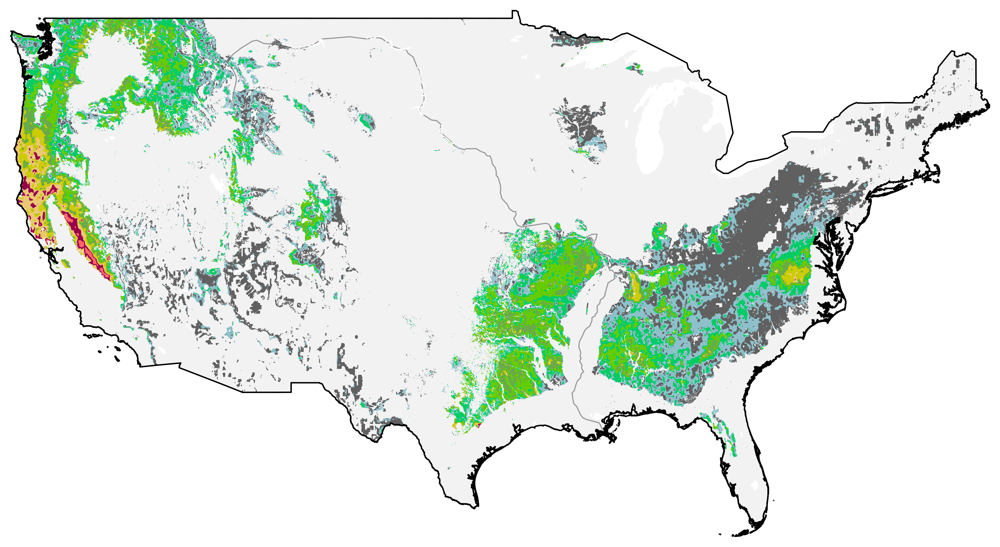

In [23]:
rgb_list = ['#606060','#8ec0cb','#00CC66','#66CC00',
                                '#69aa4c','#CCCC00','#ebc874','#99004C','#FF6666']

name = [f'Sbedrock', 'Sbedrock', 'Sbedrock', '$S_{bedrock}$ (mm)']
level = np.arange(0,500,50)
cmap = colors.ListedColormap(rgb_list)
draw1(df1,name,level,cmap)

In [18]:
def draw2(df1,name,level,cmap):
    df1 = df1[df1[name[1]] > 0]
    df1['Percentage'] = df1[name[0]]/df1[name[1]]*100

    fig = plt.figure(figsize=(12, 6), dpi=500)

    fig.subplots_adjust(left=0.05, right=0.98, 
                    bottom=0.14, top=0.95, hspace=0.25) 
        
    #Create a subgraph grid with 2 rows and 3 columns
    gs = GridSpec(2, 6)
    ax = fig.add_subplot(gs[:, :], projection=ccrs.PlateCarree())

    # Set drawing mode(note:extent's lat from positive to negative)
    img = ax.scatter(df1['lon'], df1['lat'], c=df1['Percentage'], 
                    s=0.1, linewidths=0, edgecolors="k", 
                    cmap=cmap, zorder=4, vmin=level[0], vmax=level[-1])

    for spine in ax.spines.values():
        spine.set_edgecolor('black')  
        spine.set_linewidth(0)  

    ax.set_xlim(region[0], region[1])
    ax.set_ylim(region[2], region[3])

    # coastline = cfeature.NaturalEarthFeature('physical', 'coastline', '50m', edgecolor='0.6', facecolor='none')
    rivers = cfeature.NaturalEarthFeature('physical', 'rivers_lake_centerlines', '110m', edgecolor='0.6', facecolor='none')
    ax.add_feature(cfeature.LAND, facecolor='0.95',zorder=1)
    # ax.add_feature(coastline, linewidth=0.6)
    ax.add_feature(cfeature.LAKES, alpha=1, facecolor='white', edgecolor='none', zorder=2)
    ax.add_feature(rivers, linewidth=0.8)
    # ax.gridlines(draw_labels=False, linestyle=':', linewidth=0.7, color='grey', alpha=0.8)

    # ax.add_feature(cfeature.COASTLINE)
    ax.set_extent([region[0], region[1], region[2], region[3]], crs=ccrs.PlateCarree())
    ax.xaxis.set_major_formatter(LongitudeFormatter())
    ax.yaxis.set_major_formatter(LatitudeFormatter())

    us_bbox = gpd.GeoSeries([box(region[0]-5, region[2]-5, region[1]+5, region[3]+5)], crs=shp.crs)
    shp_union = unary_union(shp.geometry)
    external_area = us_bbox.difference(shp_union)
    external_area.plot(ax=ax, facecolor='white', edgecolor='none', zorder=3)
    
    bbox = gpd.GeoSeries([box(region[0], region[2], region[1], region[3])], crs=shp.crs)
    clipped_shapefile = gpd.clip(shp, bbox)
    clipped_shapefile.plot(ax=ax, facecolor='none', edgecolor='black',linewidth=1,transform=ccrs.PlateCarree(),zorder=5)
    # ax.grid(ls = "--", lw = 0.25, color = "#4E616C")

    plt.tight_layout()
    plt.show()


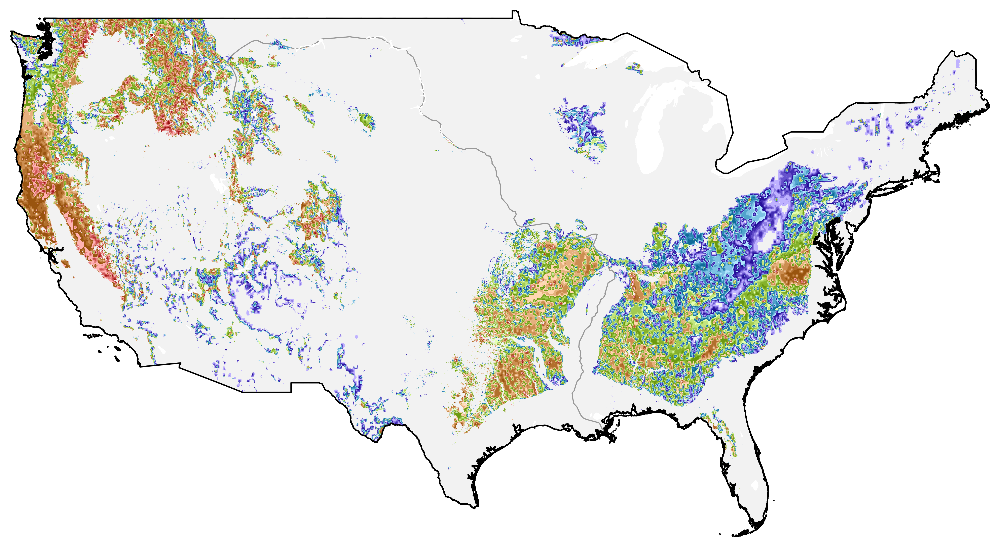

In [19]:
name = [f'Sbedrock', 'Sr', 'Sr', '$S_{r}$ (mm)']
level = np.arange(0,120,20)
cmap = cmaps.StepSeq25_r
draw2(df1,name,level,cmap)